#### Create a look up table for each WT that provides the next nearest weather type (or centroid) 

NPL 2022b

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

#### read exustubg centroid
rgrCentroids(12 | wt, 3 | mslp, wnd700, pw, 24 | lat, 74 | lon)

In [4]:
sCentroids = 'CONUS-WTs_existing_centroids.npz'
DATA = np.load(sCentroids)
rgrCentroids = DATA['rgrCentroids']               # (12, 3, 24, 74)
rgiWTs = range(1, rgrCentroids.shape[0]+1, 1)     # number of WT 
n_wt  = rgrCentroids.shape[0]
n_var = rgrCentroids.shape[1]
n_lat = rgrCentroids.shape[2]
n_lon = rgrCentroids.shape[3]

['rgrLonWT', 'rgrCentroids', 'rgrSTDDEVCentroids', 'rgrLatWT']


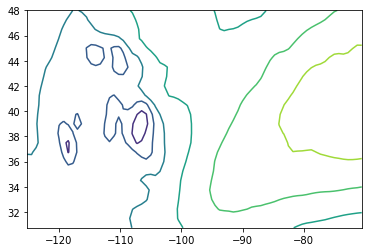

In [5]:
#Veiew.npz file  
print(DATA.files)  # ['rgrLonWT', 'rgrCentroids', 'rgrSTDDEVCentroids', 'rgrLatWT']
rgrLatWT=DATA['rgrLatWT']  # [-125.25, ..., -70.5]
rgrLonWT=DATA['rgrLonWT']  # [48, ..., 30.75]

wt_1=rgrCentroids[0,1]
plt.contour(rgrLonWT, rgrLatWT, wt_1);

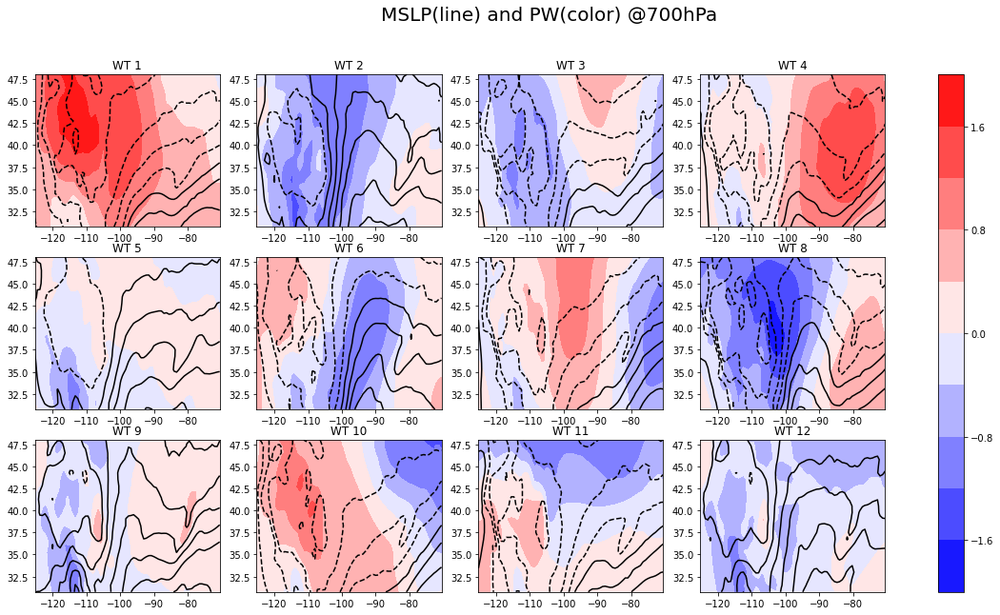

In [6]:
fig, axs = plt.subplots(3, 4, figsize=(20,10))
 
ct = 0
levels = np.linspace(-2,2, 11)

for nr in range(0,3):
    for nc in range(0,4):
        msl=axs[nr,nc].contourf(rgrLonWT, rgrLatWT, rgrCentroids[ct,0], levels=levels, cmap='bwr')
        pw =axs[nr,nc].contour(rgrLonWT, rgrLatWT, rgrCentroids[ct,2],colors='k')
        
        ct +=1
        axs[nr,nc].title.set_text("WT " + str(ct))

# Set a Single Main Title for All the Subplots
fig.suptitle('MSLP(line) and PW(color) @700hPa', fontsize=20)        
fig.colorbar(msl, ax=axs.ravel().tolist()) ;

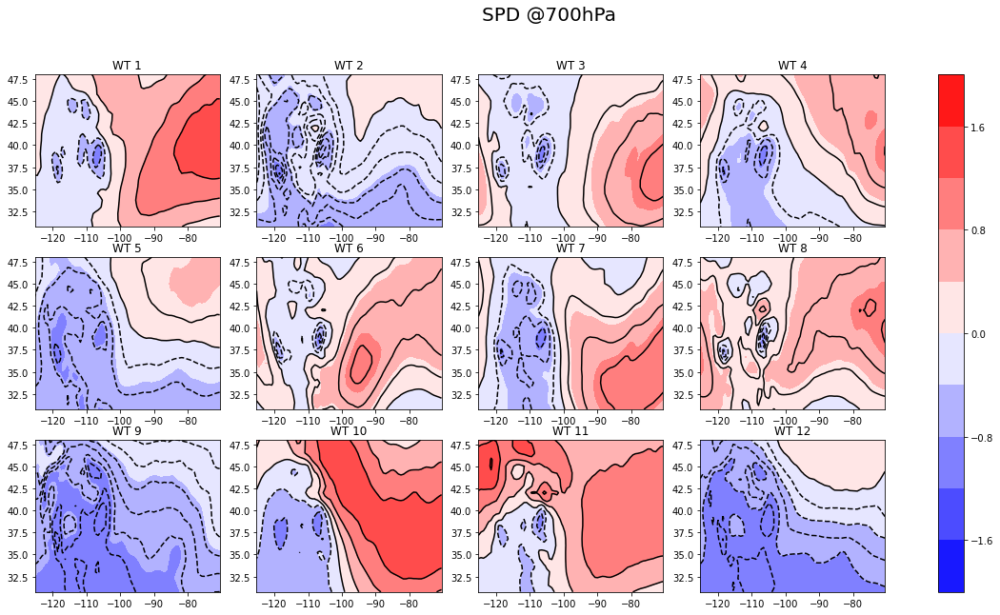

In [7]:
fig, axs = plt.subplots(3, 4, figsize=(20,10))
 
ct = 0
levels = np.linspace(-2,2, 11)

for nr in range(0,3):
    for nc in range(0,4):
        msl=axs[nr,nc].contourf(rgrLonWT, rgrLatWT, rgrCentroids[ct,1], levels=levels, cmap='bwr')
        pw =axs[nr,nc].contour(rgrLonWT, rgrLatWT, rgrCentroids[ct,1],colors='k')
        
        ct +=1
        axs[nr,nc].title.set_text("WT " + str(ct))

# Set a Single Main Title for All the Subplots
fig.suptitle('SPD @700hPa', fontsize=20)
fig.colorbar(msl, ax=axs.ravel().tolist()) ;

#### calculate distance of WTs

In [8]:
rgiEuclDist=np.zeros((n_wt, n_wt))
rgiEuclDist[:]=np.nan                
rgrWTarray=np.zeros((n_wt))
rgrWTarray[:]=np.nan  

dist_wt_2d = np.zeros((n_wt, n_wt), dtype=np.int8)

# Generating a range of numbers as strings 
index_s  = ['WT' + str(i).zfill(2) for i in range(1,n_wt+1)]  
column_s = ['rank ' + str(i).zfill(2) for i in range(1,n_wt+1)]  
 
for tt in range(n_wt):
    # loop over WTs
    for wt in range(n_wt):
        rgiEuclDist[tt,wt]=np.linalg.norm(rgrCentroids[wt,:,:,:]-rgrCentroids[tt,:,:,:])

    # create DataFrame from dict narray
    data = {'WT': rgiWTs, 'distance':rgiEuclDist[tt, :]}
    df = pd.DataFrame(data)
    
    df = df.sort_values('distance')
    #print(df)
    dist_wt_2d[tt,:] = df.WT
    #print(dist_wt_2d[tt,:] )
    
# create DataFrame from dict narray
#data = {'WT': , 'distance':rgiEuclDist[tt, :]}
dff = pd.DataFrame(dist_wt_2d,index=index_s, columns=column_s )   
dff.to_csv('wt_lookup_table.csv') 
dff

,rank 01,rank 02,rank 03,rank 04,rank 05,rank 06,rank 07,rank 08,rank 09,rank 10,rank 11,rank 12
WT01,1,10,7,4,11,6,3,5,8,9,2,12
WT02,2,12,5,9,6,8,3,11,4,7,10,1
WT03,3,7,8,6,11,5,4,10,2,1,9,12
WT04,4,3,1,7,5,11,8,6,10,9,2,12
WT05,5,2,9,12,6,3,7,4,8,11,10,1
WT06,6,8,11,3,5,7,2,10,4,1,9,12
WT07,7,3,10,1,11,4,6,5,8,2,9,12
WT08,8,3,6,11,4,5,2,7,10,9,1,12
WT09,9,12,5,2,3,6,4,7,8,11,10,1
WT10,10,7,11,1,3,6,4,5,8,2,9,12


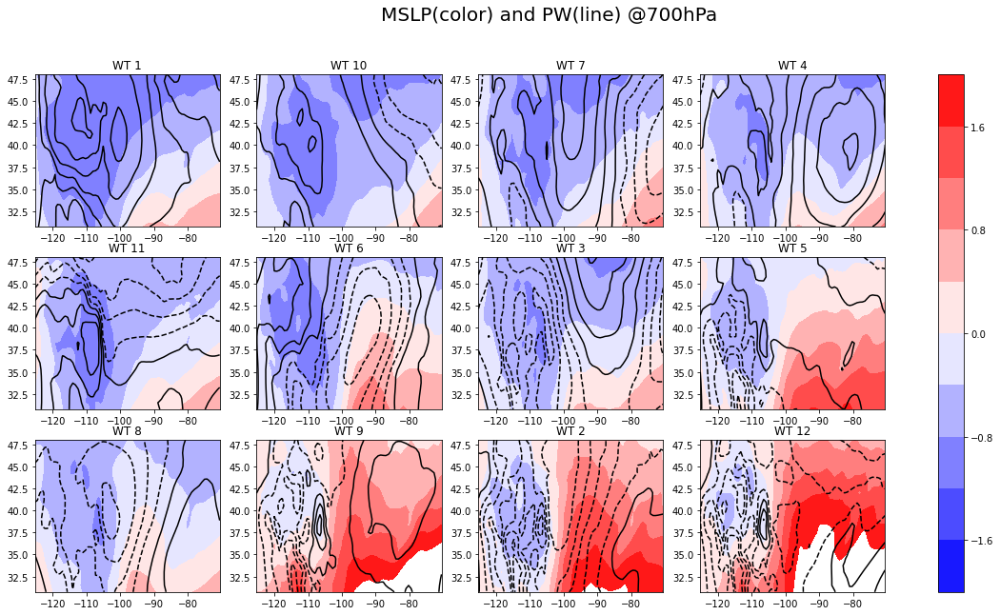

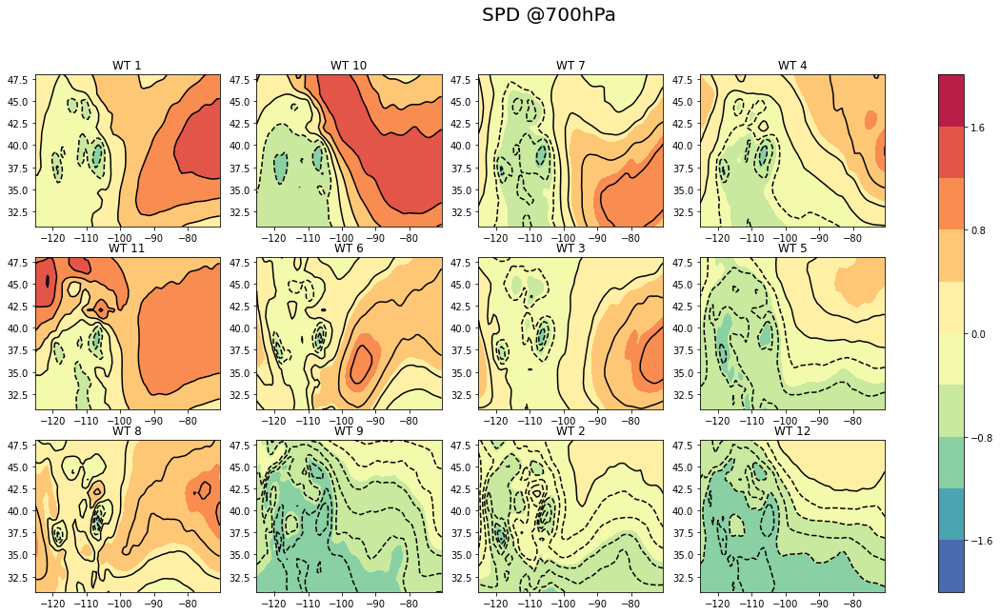

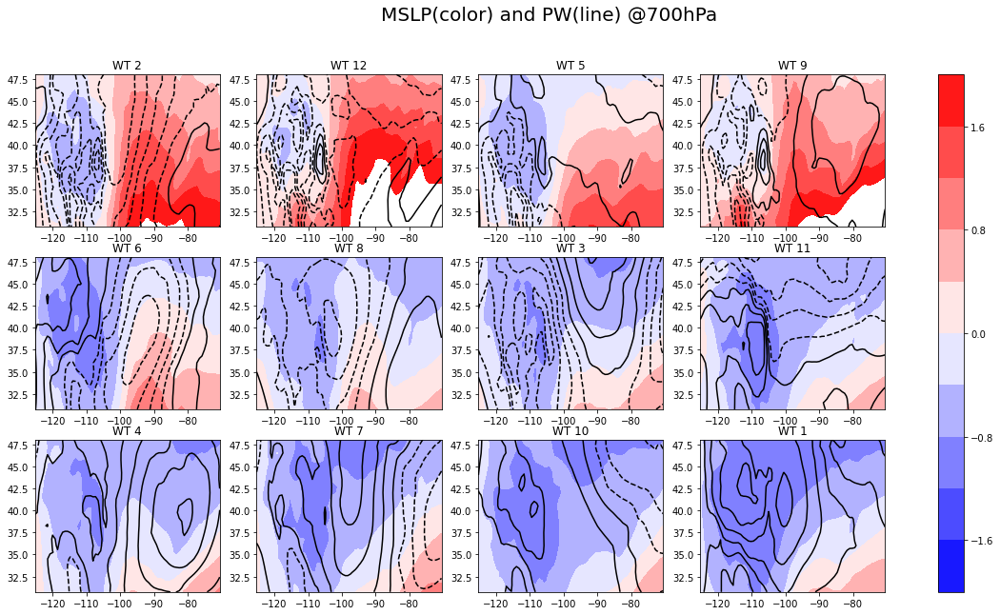

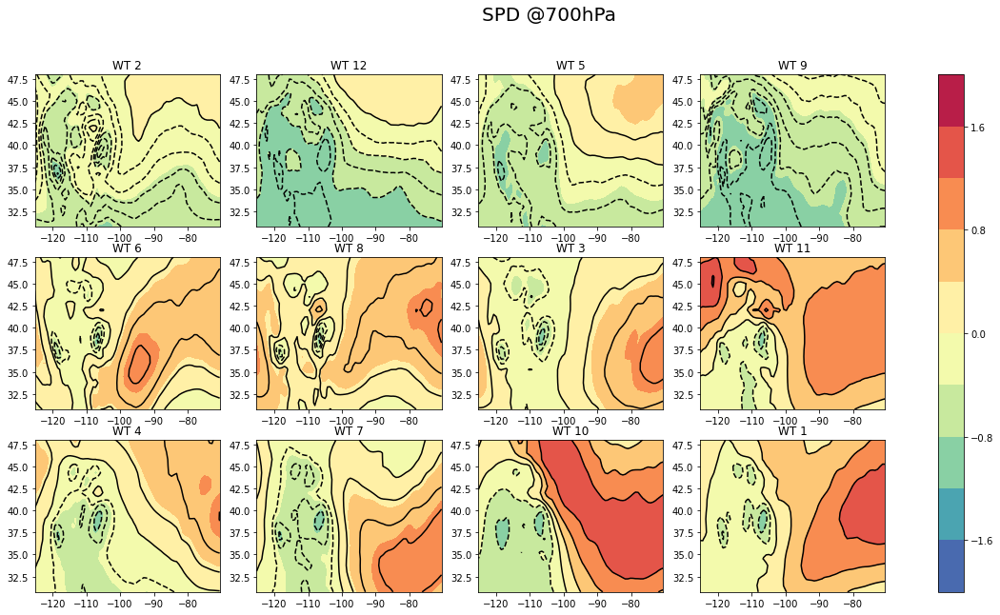

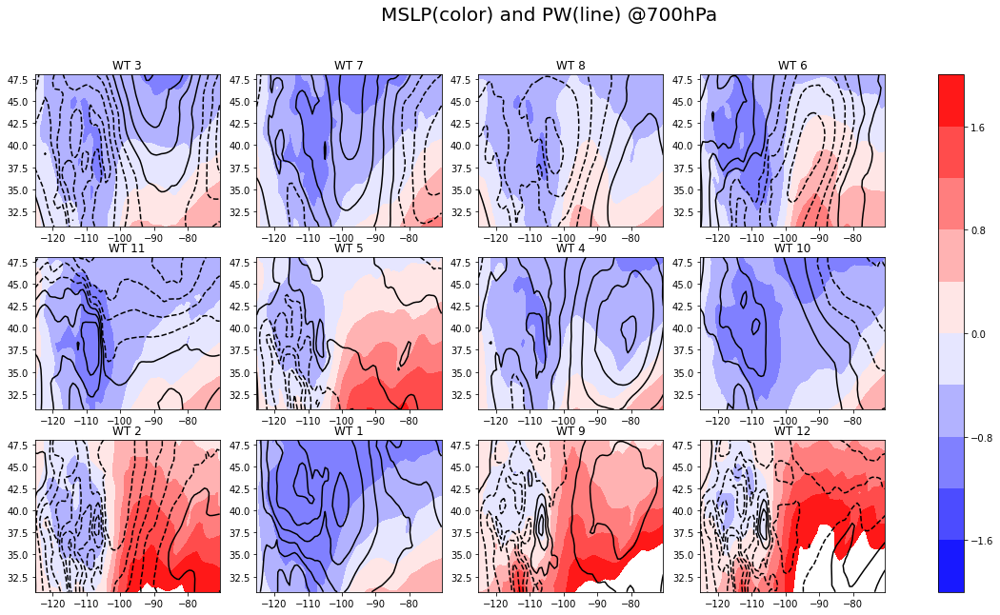

...

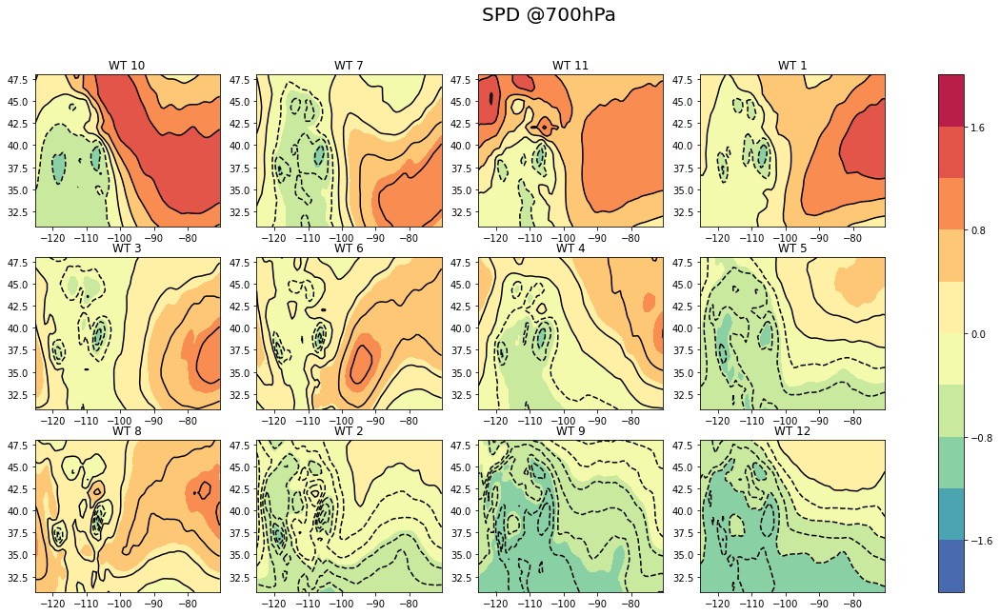

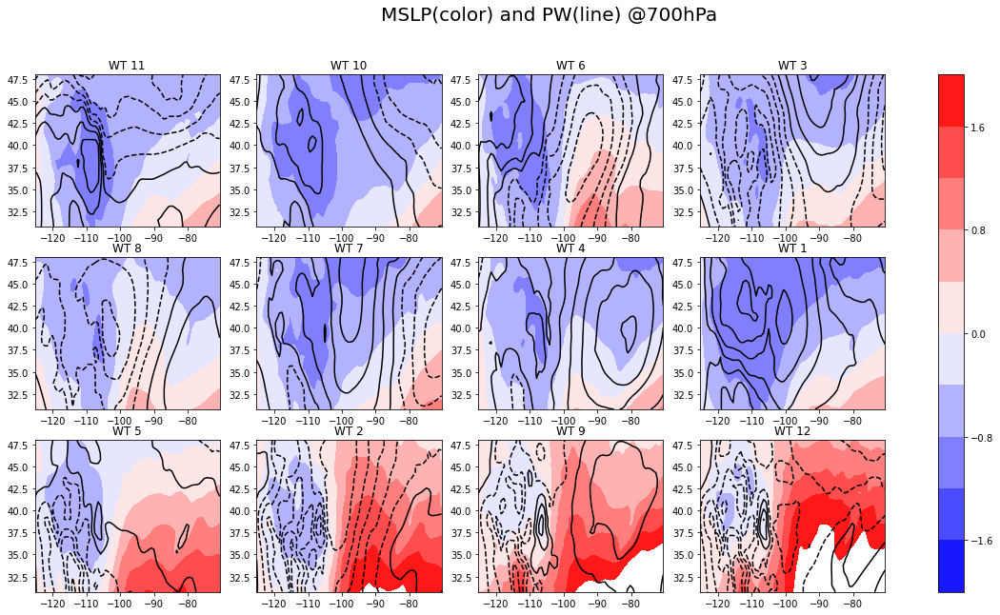

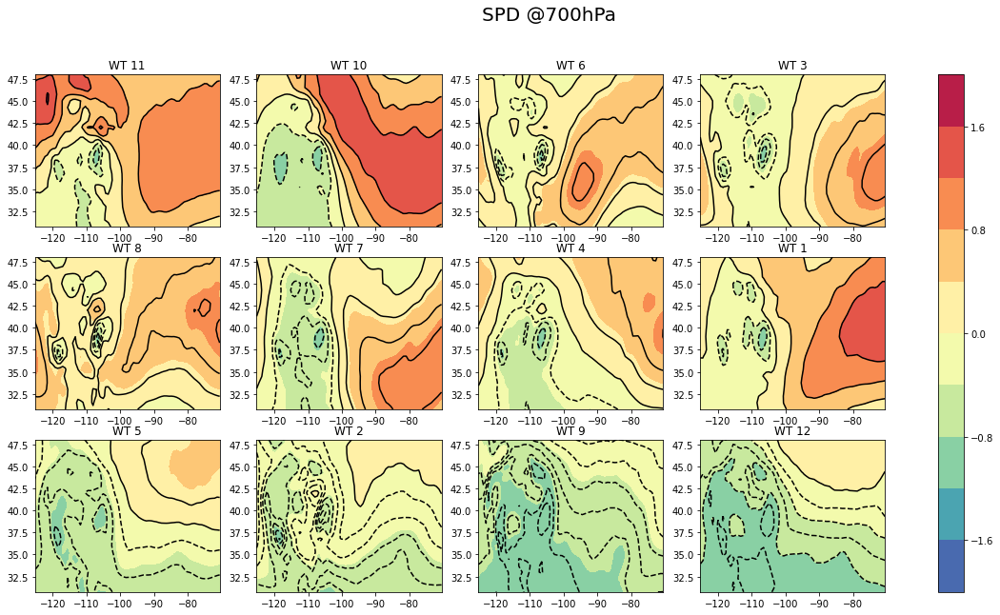

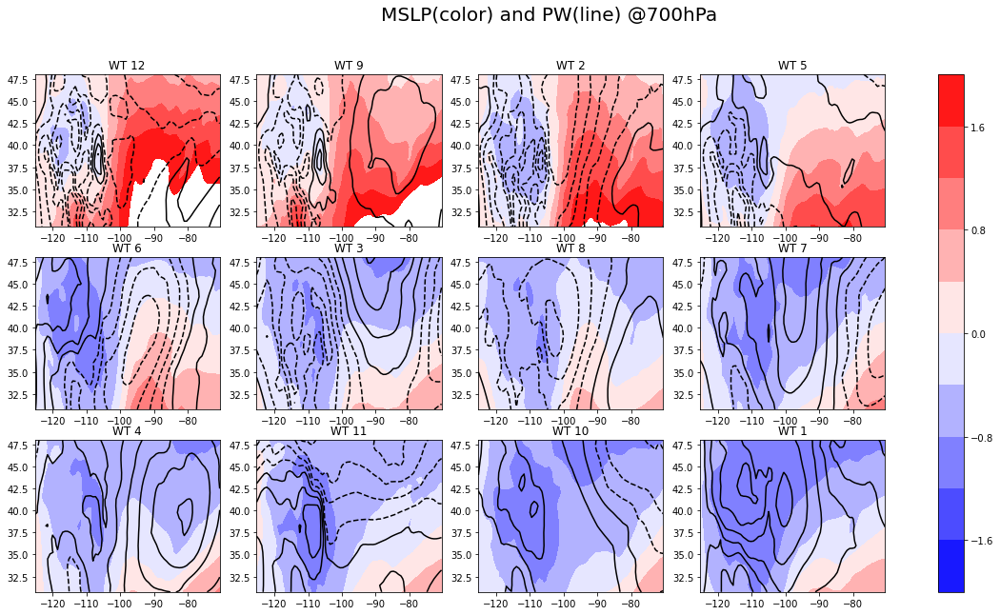

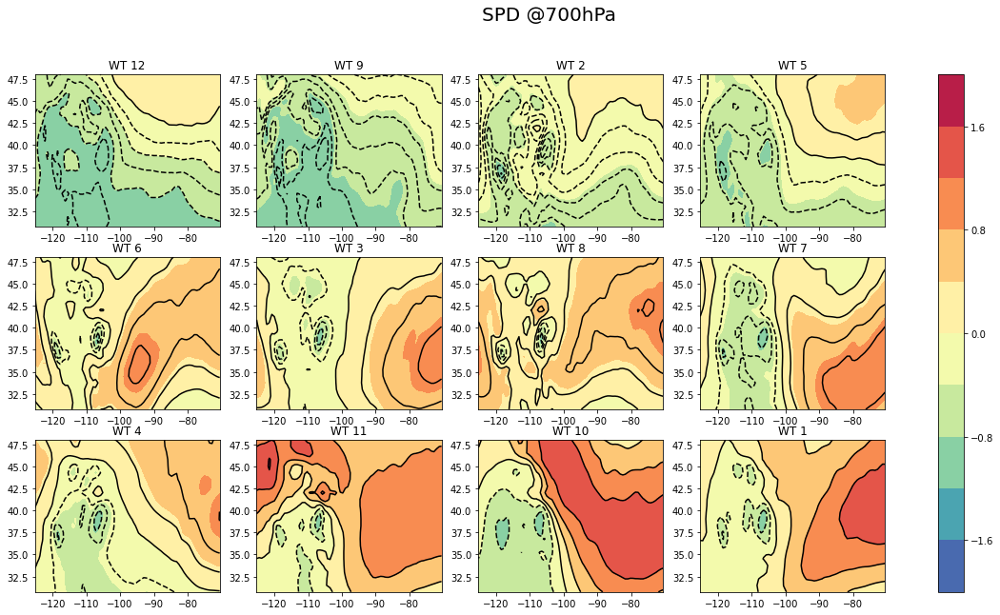

In [9]:
import matplotlib.pyplot as plt
ct = 0
levels = np.linspace(-2,2, 11)

for nw in range(0,n_wt):
  #print(nw+1)
  fig, axs = plt.subplots(3, 4, figsize=(20,10))
  ct = 0
  for nr in range(0,3):
    for nc in range(0,4):
        n_wt = dist_wt_2d[nw, ct] 
        msl=axs[nr,nc].contourf(rgrLonWT, rgrLatWT, rgrCentroids[n_wt-1, 2], levels=levels, cmap='bwr')
        pw =axs[nr,nc].contour(rgrLonWT, rgrLatWT, rgrCentroids[n_wt-1, 0],colors='k')
        
        ct +=1
        axs[nr,nc].title.set_text("WT " + str(n_wt))

  # Set a Single Main Title for All the Subplots
  fig.suptitle('MSLP(color) and PW(line) @700hPa', fontsize=20)        
  fig.colorbar(msl, ax=axs.ravel().tolist()) 
  plt.show()
   
  fig, axs = plt.subplots(3, 4, figsize=(20,10))
  ct = 0
  for nr in range(0,3):
    for nc in range(0,4):
        n_wt = dist_wt_2d[nw, ct] 
        msl=axs[nr,nc].contourf(rgrLonWT, rgrLatWT, rgrCentroids[n_wt-1,1], levels=levels, cmap='Spectral_r')
        pw =axs[nr,nc].contour(rgrLonWT, rgrLatWT, rgrCentroids[n_wt-1,1],colors='k')
        
        ct +=1
        axs[nr,nc].title.set_text("WT " + str(n_wt))

  # Set a Single Main Title for All the Subplots
  fig.suptitle('SPD @700hPa', fontsize=20)        
  fig.colorbar(msl, ax=axs.ravel().tolist()) 
  plt.show()